Assignment 2: \
Objective: \
To get good quality image from noisy images fi where 1 ≤ i ≤ n. \
Problem statement: \
Let f be an image (Lena). 0 ≤ x ≤ 255 and 0 ≤ y ≤ 255. \
Generate fi(x, y) = f(x, y) + ηi(x, y) where ηi(x, y) is the Gaussian noise with mean = 0 and variance= 1 

Find 1/n(∑ fi(x, y)) from i=1 to n, say it as g.
1. Display f, g and f1, f2, ...... fn.
2. Do it for n=5, n=10, n=20 and n=30

Explanation:
Suppose if n=5, you have to generate 5 noisy images f1, f2, f3, f4 and f5 from f by adding Gaussian noise. For Gaussian noise, you can use built in function. Then find the average of the noisy images (g) and compare it with original image f.

In [23]:
# This Assignment is done by CS20B1044 Avinash R Changrani
# importing required libraries

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [24]:
# gray scale
img = cv2.imread('./Lena.png', 0).astype(np.uint8)

# colored image in BGR format
f = cv2.imread('./Lena.png',-1)

# converting BGR to RGB
f = cv2.cvtColor(f, cv2.COLOR_BGR2RGB)

# show the image using cv2
cv2.imshow('Original image',img)

cv2.waitKey(0)

cv2.destroyAllWindows()

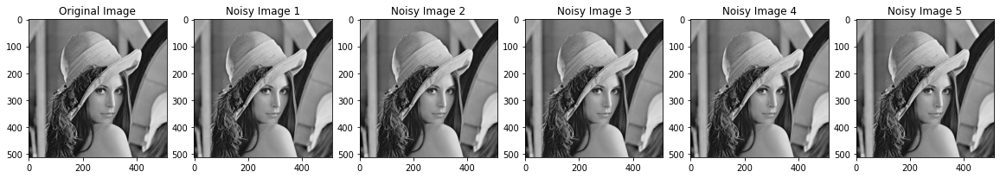

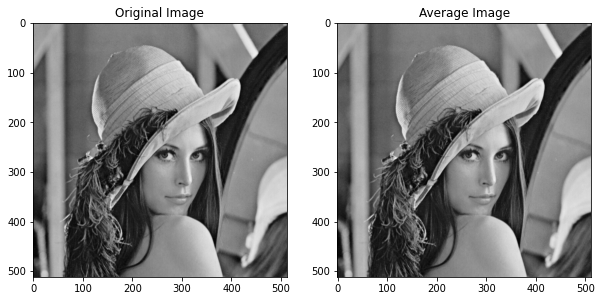

In [25]:
# for grayscale
n = 5

# Create an empty list to store the noisy images
fi_list = []

# # Generate the noisy images in grayscale
for i in range(n):
    # Generate Gaussian noise with mean = 0 and variance = 1
    noise = np.random.normal(0, 1, img.shape)
    # Add the noise to the original image
    fi = img + noise
    # Append the noisy image to the list
    fi_list.append(fi)

# Find the average image
g = np.mean(fi_list, axis=0)

# Display the original image and the noisy images
plt.figure(figsize=(20,20))
plt.subplot(1, n+1, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
for i in range(n):
    plt.subplot(1, n+1, i+2)
    plt.imshow(fi_list[i], cmap='gray')
    plt.title('Noisy Image %d' % (i+1))

# Display the average image and original image side by side
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(g, cmap='gray')
plt.title('Average Image')

plt.show()


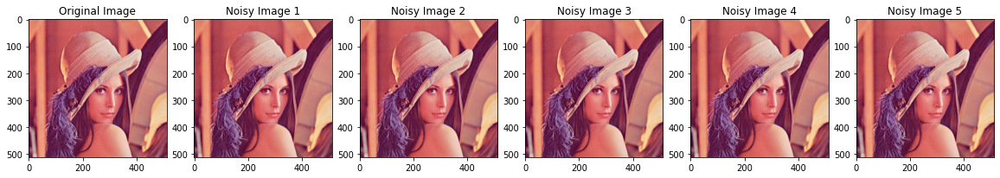

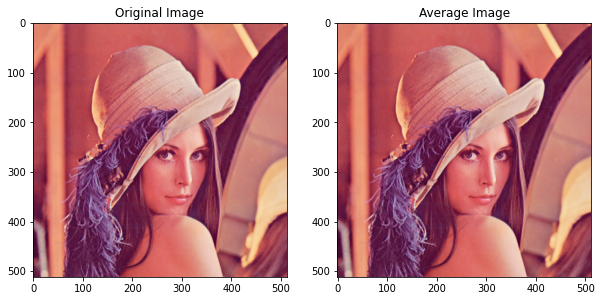

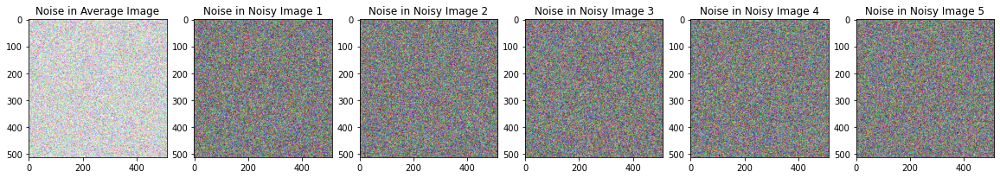

In [26]:
# original image consisting of rgb

# Set the number of noisy images to generate
n = 5

# Create an empty list to store the noisy images
fi_list = []

# Generate the noisy images
for i in range(n):
    # Create an empty image with the same shape as the original image
    fi = np.zeros(f.shape, dtype=np.float32)
    # Generate Gaussian noise with mean = 0 and variance = 1
    noise_b = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_g = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_r = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    # Add the noise to each channel
    fi[:,:,0] = np.clip(f[:,:,0] + noise_b, 0, 255)
    fi[:,:,1] = np.clip(f[:,:,1] + noise_g, 0, 255)
    fi[:,:,2] = np.clip(f[:,:,2] + noise_r, 0, 255)
    # Append the noisy image to the list
    fi_list.append(fi.astype(np.uint8))

# Calculate the mean image
g = np.mean(fi_list, axis=0).astype(np.uint8)

# Display the original image and the noisy images
plt.figure(figsize=(20,20))
plt.subplot(1, n+1, 1)
plt.imshow(f, cmap=None)
plt.title('Original Image')
for i in range(n):
    plt.subplot(1, n+1, i+2)
    plt.imshow(fi_list[i])
    plt.title('Noisy Image %d' % (i+1))

# Display the average image and original image side by side
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(f)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(g)
plt.title('Average Image')

# plot noise of mean image and noise of all the images
plt.figure(figsize=(20,20))
plt.subplot(1, n+1, 1)
plt.imshow(g-f)
plt.title('Noise in Average Image')
for i in range(n):
    plt.subplot(1, n+1, i+2)
    plt.imshow(fi_list[i]-f)
    plt.title('Noise in Noisy Image %d' % (i+1))
    
plt.show()

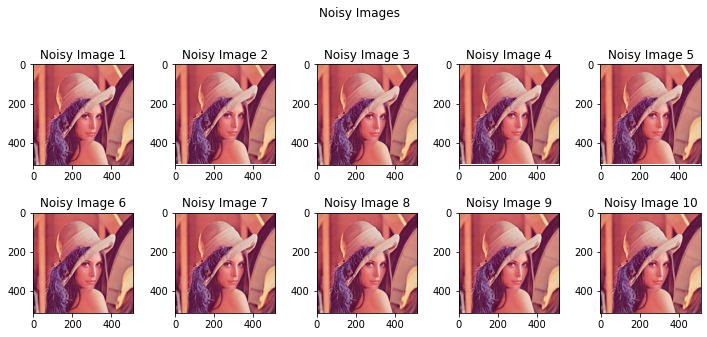

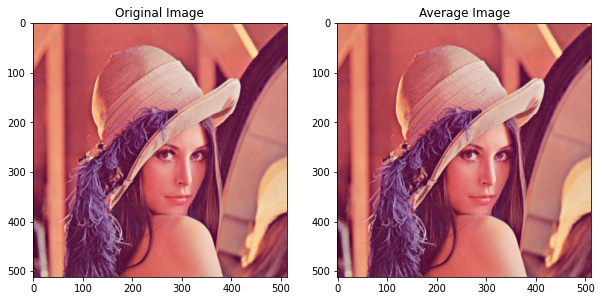

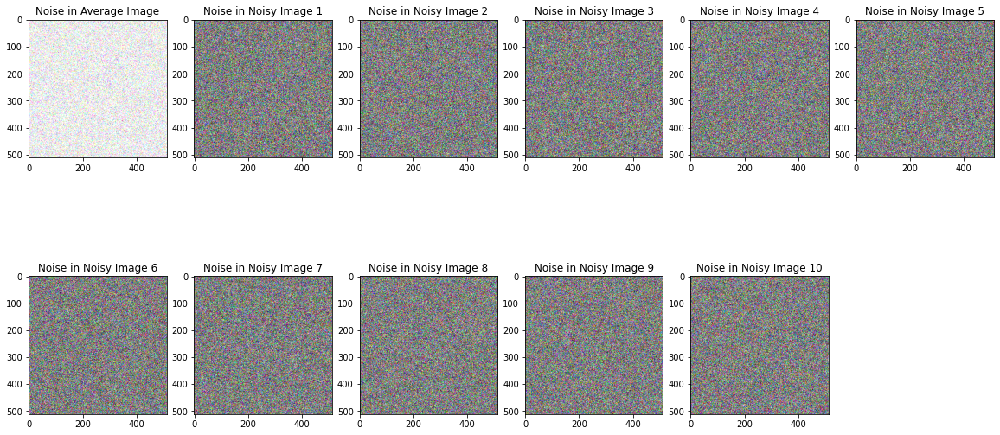

In [27]:
# original image consisting of rgb

# Set the number of noisy images to generate
n = 10

# Create an empty list to store the noisy images
fi_list = []

# Generate the noisy images
for i in range(n):
    # Create an empty image with the same shape as the original image
    fi = np.zeros(f.shape, dtype=np.float32)
    # Generate Gaussian noise with mean = 0 and variance = 1
    noise_b = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_g = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_r = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    # Add the noise to each channel
    fi[:,:,0] = np.clip(f[:,:,0] + noise_b, 0, 255)
    fi[:,:,1] = np.clip(f[:,:,1] + noise_g, 0, 255)
    fi[:,:,2] = np.clip(f[:,:,2] + noise_r, 0, 255)
    # Append the noisy image to the list
    fi_list.append(fi.astype(np.uint8))

# Calculate the mean image
g = np.mean(fi_list, axis=0).astype(np.uint8)

# Display the noisy images
fig, axs = plt.subplots(2, 5, figsize=(10,5))

fig.suptitle("Noisy Images")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

for i in range(n):
    axs[i//5, i%5].imshow(fi_list[i])
    axs[i//5, i%5].set_title("Noisy Image {}".format(i+1))
    # axs[i//5, i%5].set_xticklabels([])
    # axs[i//5, i%5].set_yticklabels([])

# Display the average image and original image side by side
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(f)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(g)
plt.title('Average Image')

# plot noise of mean image and noise in all images in fi_list
plt.figure(figsize=(20,10))
plt.subplot(2, 6, 1)
plt.imshow(g-f)
plt.title('Noise in Average Image')
for i in range(n):
    plt.subplot(2, 6, i+2)
    plt.imshow(fi_list[i]-f)
    plt.title('Noise in Noisy Image %d' % (i+1))



plt.show()

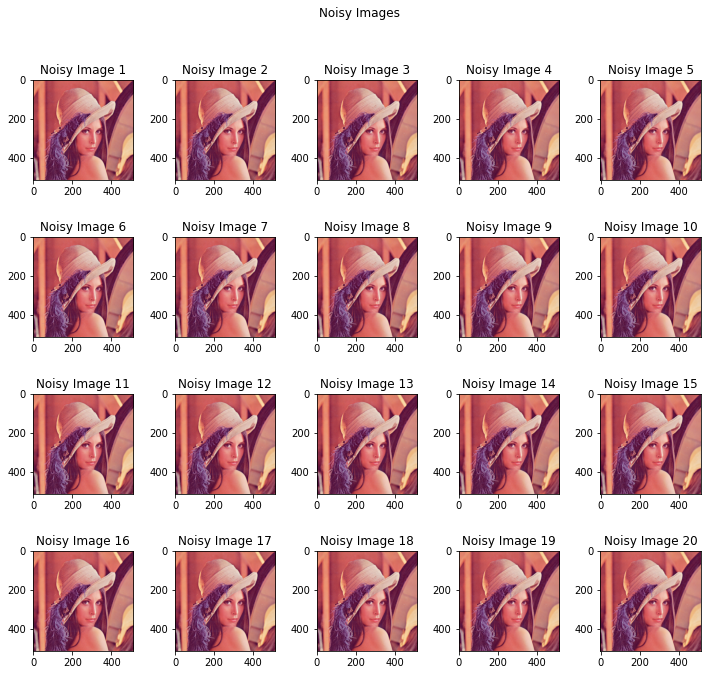

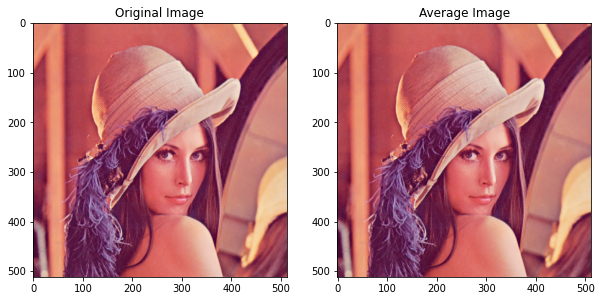

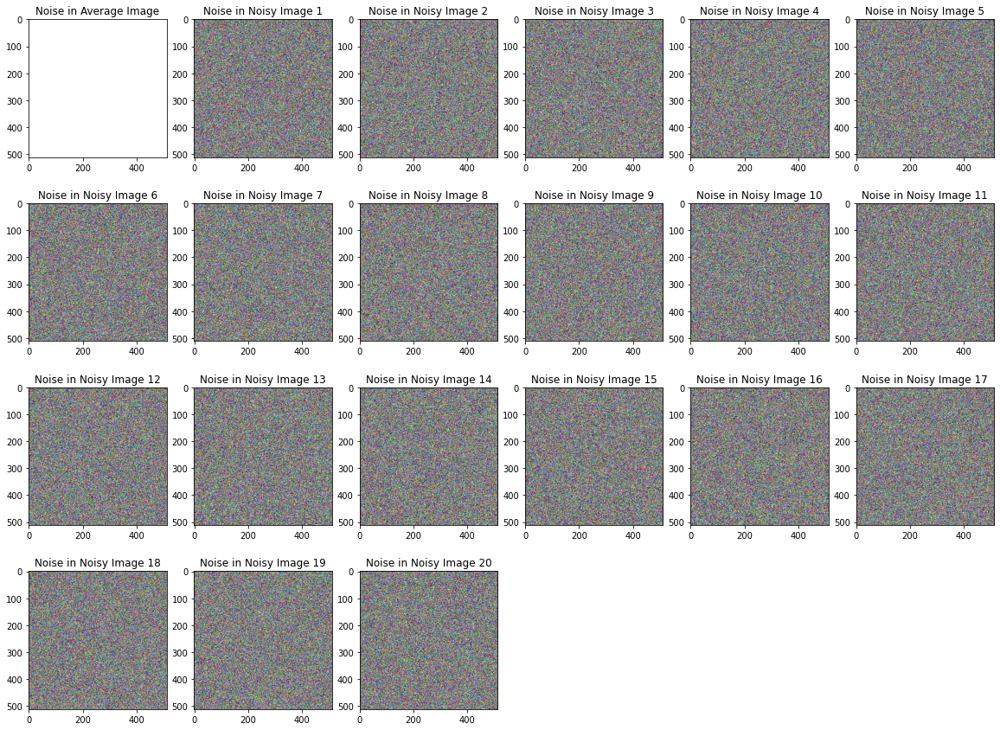

In [28]:
# original image consisting of rgb

# Set the number of noisy images to generate
n = 20

# Create an empty list to store the noisy images
fi_list = []

# Generate the noisy images
for i in range(n):
    # Create an empty image with the same shape as the original image
    fi = np.zeros(f.shape, dtype=np.float32)
    # Generate Gaussian noise with mean = 0 and variance = 1
    noise_b = np.random.normal(0, 0.1, (f.shape[0], f.shape[1]))
    noise_g = np.random.normal(0, 0.1, (f.shape[0], f.shape[1]))
    noise_r = np.random.normal(0, 0.1, (f.shape[0], f.shape[1]))
    # Add the noise to each channel
    fi[:,:,0] = np.clip(f[:,:,0] + noise_b, 0, 255)
    fi[:,:,1] = np.clip(f[:,:,1] + noise_g, 0, 255)
    fi[:,:,2] = np.clip(f[:,:,2] + noise_r, 0, 255)
    # Append the noisy image to the list
    fi_list.append(fi.astype(np.uint8))

# Calculate the mean image
g = np.mean(fi_list, axis=0).astype(np.uint8)

# Display the noisy images
fig, axs = plt.subplots(4, 5, figsize=(10,10))

fig.suptitle("Noisy Images")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

for i in range(n):
    axs[i//5, i%5].imshow(fi_list[i])
    axs[i//5, i%5].set_title("Noisy Image {}".format(i+1))
    # axs[i//5, i%5].set_xticklabels([])
    # axs[i//5, i%5].set_yticklabels([])

# Display the average image and original image side by side
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(f)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(g)
plt.title('Average Image')

# plot noise of mean image and noise in all images in fi_list 
plt.figure(figsize=(20,15))
plt.subplot(4, 6, 1)
plt.imshow(g-f)
plt.title('Noise in Average Image')
for i in range(n):
    plt.subplot(4, 6, i+2)
    plt.imshow(fi_list[i]-f)
    plt.title('Noise in Noisy Image %d' % (i+1))

plt.show()

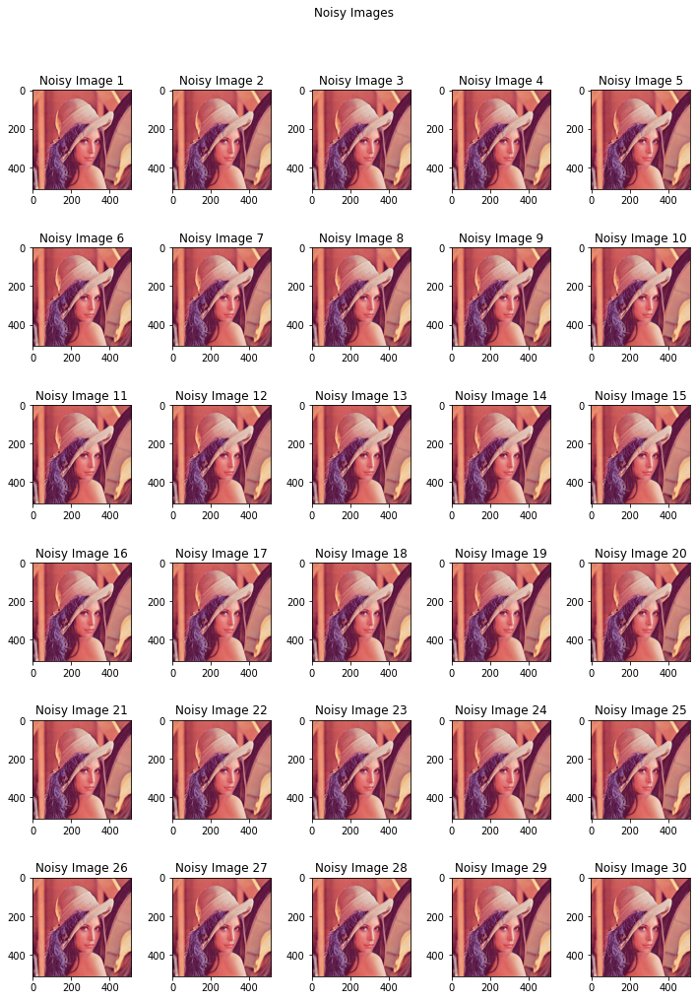

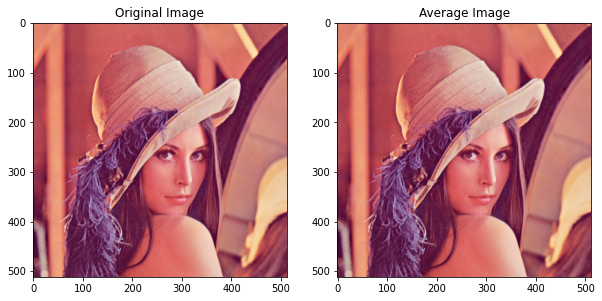

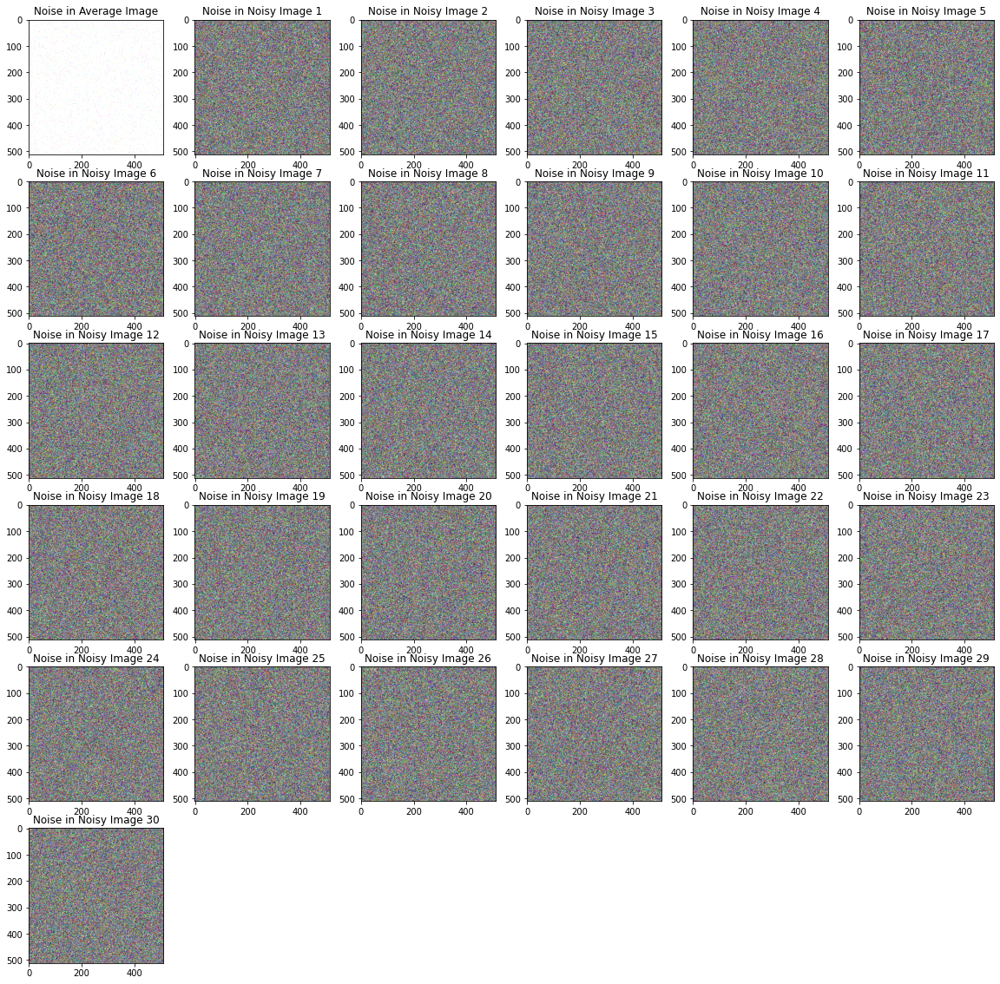

In [29]:
# original image consisting of rgb

# Set the number of noisy images to generate
n = 30

# Create an empty list to store the noisy images
fi_list = []

# Generate the noisy images
for i in range(n):
    # Create an empty image with the same shape as the original image
    fi = np.zeros(f.shape, dtype=np.float32)
    # Generate Gaussian noise with mean = 0 and variance = 1
    noise_b = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_g = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    noise_r = np.random.normal(0, 1, (f.shape[0], f.shape[1]))
    # Add the noise to each channel
    fi[:,:,0] = np.clip(f[:,:,0] + noise_b, 0, 255)
    fi[:,:,1] = np.clip(f[:,:,1] + noise_g, 0, 255)
    fi[:,:,2] = np.clip(f[:,:,2] + noise_r, 0, 255)
    # Append the noisy image to the list
    fi_list.append(fi.astype(np.uint8))

# Calculate the mean image
g = np.mean(fi_list, axis=0).astype(np.uint8)

# Display the noisy images
fig, axs = plt.subplots(6, 5, figsize=(10,15))

fig.suptitle("Noisy Images")
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

for i in range(n):
    axs[i//5, i%5].imshow(fi_list[i])
    axs[i//5, i%5].set_title("Noisy Image {}".format(i+1))
    # axs[i//5, i%5].set_xticklabels([])
    # axs[i//5, i%5].set_yticklabels([])

# Display the average image and original image side by side
plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(f)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(g)
plt.title('Average Image')

# plot noise of mean image and noise in all images in fi_list
plt.figure(figsize=(20,20))
plt.subplot(6, 6, 1)
plt.imshow(g-f)
plt.title('Noise in Average Image')
for i in range(n):
    plt.subplot(6, 6, i+2)
    plt.imshow(fi_list[i]-f)
    plt.title('Noise in Noisy Image %d' % (i+1))


plt.show()